In [102]:
import os
import json
import time
import datetime as dt
import numpy as np
import pandas as pd
import factoroid as fr
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import warnings
warnings.filterwarnings('ignore')

WebSQL = fr.connector.MySQLDB('db-01')
DevSQL = fr.connector.MySQLDB('db-dev')

Successfully connected; Factorid web services
Successfully connected; Factoroid development


In [103]:
from model.utils_function import *
from model.utils_cycle import *
from model.utils_output import *
from model.utils_main import *
from model.utils_preprocessor import *

In [104]:
now = dt.datetime.now().replace(hour=8, minute=0, second=0, microsecond=0)
now = now - dt.timedelta(days=2) if now.weekday() == 0 else now
# now = dt.datetime(2022, 4, 28, 8)
print(now)

2022-04-29 08:00:00


In [105]:
str_datetime = str(now.date())
if not os.path.exists(f'./result/{str_datetime}'):
    os.mkdir(f'./result/{str_datetime}')

In [106]:
# SO data load
# SO data merge

so = pd.DataFrame(WebSQL.query(f'''
                                    SELECT stop.equipment_name AS equipment_name, stop.order_number AS so, stop.gop AS gop, stop.material AS material, stop.routing_revision AS routing_revision, stop.qty AS qty, start.report_date AS start_time, MAX(stop.report_date) AS stop_time
                                    FROM so_log_yulkok AS stop
                                    LEFT JOIN (SELECT equipment_name, order_number, gop, material, qty, MIN(report_date) AS report_date, routing_revision
                                               FROM so_log_yulkok
                                               WHERE equipment_name IN ('G3020 #1', 'CMI 3S #8', 'DMC60T#3', 'DMU 50 3rd Generation #2', 'ECOSPEED F1040 #2', 'EVER 7', 
                                                                     'FMS ZT-800 #3', 'H5-800', 'HFP1540 PROTO', 'HU80A-5X', 'KT MODU LINE #3', 'MC18200 #1',
                                                                     'MP2150', 'MYNX500#1', 'SB-416', 'SNK RB-200F(2060)', 'VC630/5AX #S4', 'VMP8-6P', 'YK 3070(TCP-30TS)')
                                            AND status = '보고시작' AND report_date >= '{str(now - dt.timedelta(days=7))}' AND report_date <= '{str(now)}'
                                            GROUP BY equipment_name, order_number, gop, material, qty, routing_revision) AS start
                                            ON stop.equipment_name = start.equipment_name AND stop.order_number = start.order_number AND stop.gop = start.gop AND stop.material = start.material AND stop.qty = start.qty AND stop.routing_revision = start.routing_revision
                                    WHERE stop.equipment_name IN ('G3020 #1', 'CMI 3S #8', 'DMC60T#3', 'DMU 50 3rd Generation #2', 'ECOSPEED F1040 #2', 'EVER 7', 
                                                                  'FMS ZT-800 #3', 'H5-800', 'HFP1540 PROTO', 'HU80A-5X', 'KT MODU LINE #3', 'MC18200 #1',
                                                                  'MP2150', 'MYNX500#1', 'SB-416', 'SNK RB-200F(2060)', 'VC630/5AX #S4', 'VMP8-6P', 'YK 3070(TCP-30TS)')
                                    AND stop.status = '보고완료' AND stop.completion_flag = 'X' AND stop.report_date >= '{str(now - dt.timedelta(days=1))}' AND stop.report_date < '{str(now)}'
                                    GROUP BY equipment_name, so, gop, material, qty, routing_revision;
                                '''), columns=['equipment_name', 'so', 'gop', 'material', 'routing_revision', 'qty', 'start_time', 'stop_time', 'total_runtime'])

so.total_runtime = round((so.stop_time - so.start_time) / np.timedelta64(1,'h'), 3)
so = so.dropna().sort_values(by=['equipment_name', 'start_time']).reset_index(drop=True)

In [107]:
cycle_summary = pd.DataFrame(columns=['factory_id', 'process_id', 'equipment_id', 'equipment_name', 
                                      'material', 'routing_revision', 'so', 'gop', 'qty', 'cycle_number', 'start_time', 'stop_time',
                                      'spindle', 'idle_inter', 'total'])

In [108]:
so_g = so.groupby(['equipment_name'])
so_g_keys = list(so_g.groups.keys())
if not so_g_keys:
    print('Not found SO data')
else:
    print(f'\nSO data length: {so.shape[0]}\n{", ".join(so_g_keys)}\n')

for machine in so_g_keys:
    so_df_ = so_g.get_group(machine).reset_index(drop=True)
    so_df_ = so_df_[so_df_.total_runtime > 0.1]
    print(f'{machine}: {so_df_.shape[0]}')


SO data length: 72
CMI 3S #8, DMC60T#3, DMU 50 3rd Generation #2, ECOSPEED F1040 #2, G3020 #1, H5-800, HFP1540 PROTO, HU80A-5X, KT MODU LINE #3, MC18200 #1, MP2150, MYNX500#1, SB-416, SNK RB-200F(2060), VMP8-6P, YK 3070(TCP-30TS)

CMI 3S #8: 2
DMC60T#3: 2
DMU 50 3rd Generation #2: 2
ECOSPEED F1040 #2: 7
G3020 #1: 4
H5-800: 1
HFP1540 PROTO: 5
HU80A-5X: 1
KT MODU LINE #3: 1
MC18200 #1: 2
MP2150: 8
MYNX500#1: 2
SB-416: 17
SNK RB-200F(2060): 8
VMP8-6P: 4
YK 3070(TCP-30TS): 2


In [110]:
machine = 'DMC60T#3'
so_df_ = so_g.get_group(machine).reset_index(drop=True)
so_df_ = so_df_[so_df_.total_runtime > 0.1]
stop_times = list(so_df_.stop_time.values)
print(machine)
print(f'DataFrame Length: {so_df_.shape[0]}')
so_df_

DMC60T#3
DataFrame Length: 2


,equipment_name,so,gop,material,routing_revision,qty,start_time,stop_time,total_runtime
0,DMC60T#3,D200616840,30,182A5701-3,A,10,2022-04-27 21:39:14,2022-04-28 11:54:08,14.248
1,DMC60T#3,D200616850,30,182A5701-4,A,10,2022-04-28 11:55:01,2022-04-29 03:30:38,15.594



    index: 1,	D200616850	30	182A5701-4	10      2022-04-28 11:55:01 ~ 2022-04-29 03:30:38
    


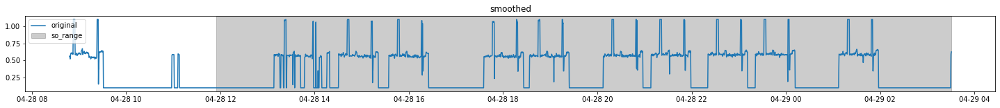

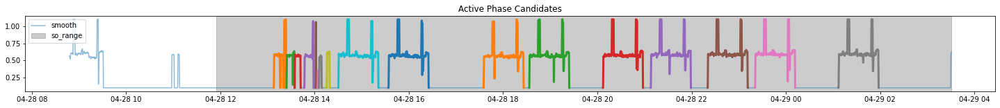

##########################################################################################
Current best candidates plot


##########################################################################################
Current best candidates:  -1,-1:0,4:5,8:9,9:10,10:11,11:12,12:13,13:14,14:15,15:16,16
Size of active phases:  17
##########################################################################################


_______________________________________________________________________________________
1. 'Y': Select best candidates or Press enter with empty blank
2. 'N': best candidates looks good...
Building new cycle patterns based on user input


Final complete cycle:  [(0, 7), (8, 8), (9, 9), (10, 10), (11, 11), (12, 12), (13, 13), (14, 14), (15, 15), (16, 16)]
now?  [83]
Updating the parameter with the latest information
[83] [(0, 7), (8, 8), (9, 9), (10, 10), (11, 11), (12, 12), (13, 13), (14, 14), (15, 15), (16, 16)]


In [112]:
# index_, plotting, company = 0, True, 'yg'
plotting, company = True, 'yg'
config.plot = plotting
config.company = company

for idx_, so_ in so_df_[1:].iterrows():
    
    ######################
    ### read parameter ###
    ######################

    order_number_, gop_, material_, quantity_, so_time_, routing_revision_ = so_.so, so_.gop, so_.material, int(so_.qty), so_.total_runtime, so_.routing_revision
    parameter, gap, threshold, min_threshold, smooth_factor, step, upper_limit, mac_main, window, max_cycle, idle_value = params(machine)
    
    print(f'''
    {'='*100}
    index: {idx_},\t{order_number_}\t{gop_}\t{material_}\t{quantity_}      {so_.start_time} ~ {so_.stop_time}
    {'='*100}
    ''')

    # exchange padded time
    so_range = [so_.start_time, so_.stop_time]
    padded_time = so_time_*0.2 if ((so_time_ / quantity_) >= 1) or (quantity_ > 1) else so_time_*0.5

    ########################
    ### define timeRange ###
    ########################

    timeWindowRedefine = False
    while True:
        patterns, candidates, pattern_index, start_time, _, lll, _ = pattern_history_parse(machine, order_number_)
        # print(patterns)
        if timeWindowRedefine == False: pass
        else:
            print(f"Current time window of interest: {str(so_range[0])} ~ {str(so_range[1])}")
            time.sleep(1)
            start_ = input("Proposed new SO start datetime (format: YYYY-MM-DD HH:MM:SS): ")
            stop_ = input("Proposed new SO stop datetime (format: YYYY-MM-DD HH:MM:SS): ")
            so_range = [pd.to_datetime(start_), pd.to_datetime(stop_)]
            
        padded_range = [so_range[0] - dt.timedelta(hours=padded_time), so_range[1] + dt.timedelta(hours=padded_time)]
        plot_start_time = str(padded_range[0])
        plot_stop_time = str(stop_times[idx_+1]).replace("T", " ")[:19] if stop_times[idx_+1:idx_+2] and so_.stop_time not in stop_times[idx_+1:] else str(padded_range[1])
        period_ = fr.utils.Period([plot_start_time, plot_stop_time])

        row = WebSQL.get_data(mac=mac_main, period=period_.utc)
        data_ = fr.processor.preprocess(row)
        # data_ = signal_preprocessing(data_)
        next_data, current_data = data_[data_.timestamp > so_range[1]], data_[data_.timestamp <= so_range[1]]

        fig = go.Figure()
        fig.add_trace(go.Scatter(x=next_data.timestamp, y=next_data.value, mode='lines', line=dict(width=2, color='#1f77b4'), opacity=0.4, name='next SO', showlegend=True))
        fig.add_trace(go.Scatter(x=current_data.timestamp, y=current_data.value, mode='lines', line=dict(width=3, color='#1f77b4'), opacity=1.0, name='current data', showlegend=True))
        fig.add_vrect(x0=str(so_range[0]), x1=str(so_range[1]), opacity=0.2, fillcolor='black')
        fig.update_xaxes(showline=True, linewidth=1, linecolor='black', mirror=True, showgrid=False, rangeslider_visible=True)
        fig.update_yaxes(showline=True, linewidth=1, linecolor='black', mirror=True, showgrid=False)
        fig.update_layout(autosize=False, plot_bgcolor='white', width=1500, height=200, margin=dict(l=5,r=5,b=10,t=10,pad=2), legend=dict(orientation='h', yanchor='bottom', y=1.04, xanchor='left', x=0))
        fig.show()
        time.sleep(2)

        proceed = input("Do we need to change time window to detect at least one complete cycle? (Y/N): ")
        if proceed == "N":
            break
        timeWindowRedefine = True

    # temp dataRange, [padded_range[0], so_range[1]]
    temp = data_[(data_.timestamp > plot_start_time) & (data_.timestamp <= so_range[1])]
    
    # cleaning + smoothing + inactive phase detection
    times_, y_ = cleaning(temp, smooth_factor, min_threshold)
    smooth_ = smoothing(y_, step)
    times, ss, inactive_cycles_ = inactive_phase_cleaning_normalization(smooth_, times_, upper_limit, window, so_range)

    # active phase detection
    cycles_ = active_phase(ss, times, threshold, upper_limit, max_cycle * 60, gap, idle_value)
    cycles = cycle_generate(cycles_, times, ss, inactive_cycles_, so_range)

    ###############################
    ### define machineParameter ###
    ###############################

    parameterRedefine = False
    while True:
        if parameterRedefine == False: pass
        else:
            times, ss, cycles = params_redefine(temp, machine, so_range)
            parameter, gap, threshold, min_threshold, smooth_factor, step, upper_limit, mac_main, window, max_cycle, idle_value = params(machine)
            print('Parameter Redefine')
        
        active_phase_idx = 0
        fig = go.Figure()
        fig.add_trace(go.Scatter(x=pd.to_datetime(times), y=ss, mode='lines', opacity=0.3, name='smooth', showlegend=False))
        for _, c in enumerate(cycles):
            xx, yy = pd.to_datetime([aa[0] for aa in c]), [aa[1] for aa in c]
            center_idx, max_yy = int(len(xx)//2), max(yy)
            fig.add_trace(go.Scatter(x=xx, y=yy, mode='lines', name=f'{active_phase_idx}', line=dict(width=3)))
            fig.add_trace(go.Scatter(x=[xx[center_idx]], y=[max_yy*1.1], mode='markers+text', text=f'{active_phase_idx}',
                            textposition='middle center', textfont=dict(family='bold', color='black'),
                            marker=dict(color='gray',opacity=0.2,size=15, line=dict(color='black', width=2)), showlegend=False))
            active_phase_idx += 1
        fig.add_vrect(x0=str(so_range[0]), x1=str(so_range[1]), opacity=0.2, fillcolor='black')
        fig.update_xaxes(showline=True, linewidth=1, linecolor='black', mirror=True, showgrid=False, rangeslider_visible=True)
        fig.update_yaxes(showline=True, linewidth=1, linecolor='black', mirror=True, showgrid=False)
        fig.update_layout(autosize=False, plot_bgcolor='white', width=1500, height=250, margin=dict(l=5,r=5,b=10,t=10,pad=2))
        fig.show()
        time.sleep(2)
        
        proceed = input("Do we need to change parameter to detect at least one complete cycle? (Y/N): ")
        if proceed == "N":
            break
        parameterRedefine = True

    # cycle parameter
    cycle_parameter = parameter[machine]['cycle']
    # cycle_parameter['L'] = 500 if cycle_parameter['lower_limit'] <= 100 else 1000
    cycle_parameter['L'] = 500 if cycle_parameter['lower_limit'] <= 100 and machine not in ['SNK RB-200F(2060)'] else 1000
    cycle_parameter['min_dist'] = round(max(cycle_parameter['lower_limit'] ** 0.4, 2.8), 1) * 1.3
    cycle_parameter['order'] = int(min(max(cycle_parameter['lower_limit'] ** 0.6, 5), 15))
    cycle_parameter['gap'] = 50
    cycle_parameter['n'] = 5
    cycle_parameter['cycle_gap'] = [30, 60][machine not in {"G3020 #1"}]

    ###########################
    ### detect machineCycle ###
    ###########################
    
    # quantity_ 장비마다 스핀들 배수 적용
    redefine_quantity = quantityRedefine(machine, quantity_)

    # order_number 미사용
    patterns, candidates, first_phase, last_phase = pattern_detector(cycles, cycle_parameter, machine, order_number_)
    output, complete_cycle = best_cycle(patterns, redefine_quantity)

    output, patterns, candidates, machine, complete_cycle, first_phase, last_phase, flag = so_pattern_output(output, patterns, candidates, machine, complete_cycle, times, ss, cycles, first_phase, last_phase,  material_, order_number_, cycle_parameter)
    
    # if the flag is True (pattern was found manually, let's revise the parameter file
    if flag and output != []:
        timeInterval = [patterns[i][0]//60 for i in output]
        if max(timeInterval) > cycle_parameter['upper_limit']:
            cycle_parameter['upper_limit'] = int(max(timeInterval) * 1.1)
        if min(timeInterval) < cycle_parameter['lower_limit']:
            cycle_parameter['lower_limit'] = int(min(timeInterval) * 0.9)
        parameter[machine]['cycle'] = cycle_parameter
        print("Updating the parameter with the latest information")
        with open('./parameter/equipment_properties.json', 'w') as fout:
            json.dump(parameter, fout)
    
    print(output, complete_cycle)
    # # only if we have valid cycle output; otherwise, this step is not necessary
    if output != [] and complete_cycle != []:
        store_cycle_output_and_plot(output, patterns, candidates, machine, complete_cycle, times, ss, cycles, first_phase, last_phase, material_, order_number_, store=False)

    # # cycle summary
    if complete_cycle != []:
        cycle_summary = so_cycle_output(complete_cycle, cycles, cycle_summary, machine, material_, order_number_, gop_, routing_revision_)

In [113]:
cycle_summary

,factory_id,process_id,equipment_id,equipment_name,material,routing_revision,so,gop,qty,cycle_number,start_time,stop_time,spindle,idle_inter,total
0,23,49,115,DMC60T#3,182A5701-4,A,D200616850,30,10,1,2022-04-28 13:08:06.777335,2022-04-28 14:19:15.400439,0.915,0.27,1.186
1,23,49,115,DMC60T#3,182A5701-4,A,D200616850,30,10,2,2022-04-28 14:30:17.379262,2022-04-28 15:21:27.642000,0.853,0.00,0.853
2,23,49,115,DMC60T#3,182A5701-4,A,D200616850,30,10,3,2022-04-28 15:34:10.016000,2022-04-28 16:25:20.032548,0.853,0.00,0.853
3,23,49,115,DMC60T#3,182A5701-4,A,D200616850,30,10,4,2022-04-28 17:35:07.916000,2022-04-28 18:26:13.514899,0.852,0.00,0.852
4,23,49,115,DMC60T#3,182A5701-4,A,D200616850,30,10,5,2022-04-28 18:33:16.119000,2022-04-28 19:24:13.525608,0.849,0.00,0.849
5,23,49,115,DMC60T#3,182A5701-4,A,D200616850,30,10,6,2022-04-28 20:07:12.159000,2022-04-28 20:58:04.597851,0.848,0.00,0.848
6,23,49,115,DMC60T#3,182A5701-4,A,D200616850,30,10,7,2022-04-28 21:08:02.663304,2022-04-28 21:59:02.306000,0.850,0.00,0.850
7,23,49,115,DMC60T#3,182A5701-4,A,D200616850,30,10,8,2022-04-28 22:20:26.825668,2022-04-28 23:11:36.908849,0.853,0.00,0.853
8,23,49,115,DMC60T#3,182A5701-4,A,D200616850,30,10,9,2022-04-28 23:20:50.735000,2022-04-29 00:11:46.883245,0.849,0.00,0.849
9,23,49,115,DMC60T#3,182A5701-4,A,D200616850,30,10,10,2022-04-29 01:07:02.776000,2022-04-29 01:58:04.841000,0.851,0.00,0.851


In [53]:
cycle_summary.to_csv(f'./result/{now.strftime("%Y-%m-%d")}/CycleSummary.csv', index=False)

In [54]:
cycle_operation, cycle_records = db_insert(cycle_summary, 'yk_operating_cycle')
WebSQL.query_records(cycle_operation, cycle_records)
DevSQL.query_records(cycle_operation, cycle_records)

198

In [95]:
material_summary = group_by_summary(cycle_summary)
drop_qty = so.drop(['qty'], axis=1)
material_summary = material_summary.merge(drop_qty, how='left', on=['equipment_name', 'material', 'routing_revision', 'so', 'gop'])
material_summary.to_csv(f'./result/{now.strftime("%Y-%m-%d")}/MaterialSummary.csv', index=False)

In [56]:
material_operation, material_records = db_insert(material_summary, 'yk_operating_material')
WebSQL.query_records(material_operation, material_records)
DevSQL.query_records(material_operation, material_records)

60